# YOLOv12 Training with Roboflow Dataset

#Install Dependencies

In [ ]:
!pip install ultralytics openvino roboflow --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 16.8 MB/s eta 0:00:00


#Download Dataset from Roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="OPKgodsxZIpJ1zNgBMvh")
project = rf.workspace("alpha-oumar-diallo-6bn8y").project("ms-coco-2017-moh1w")
version = project.version(6)
dataset = version.download("yolov12")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ms-coco-2017-6 in yolov12:: 100%|██████████| 16250/16250 [00:05<00:00, 2870.20it/s]


In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

In [ ]:
!model = YOLO("yolo12s.yaml")

#Train YOLOv12 Model

In [ ]:
from ultralytics import YOLO

# Load a pretrained YOLO11n model
model = YOLO("yolo12s.pt")

# Train the model on the COCO8 dataset for 140 epochs
train_results = model.train(
    data="/content/coco-4/data.yaml",
    epochs=140,
    imgsz=640,
)


Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/coco-4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=Tr

  8                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1    249728  ultralytics.nn.modules.block.C2PSA           [256, 256, 1]                 
 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  1    111296  ultralytics.nn.modules.block.C3k2            [384, 128, 1, False]          
 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 16                  -1  1     32096  ultralytics.nn.modules.block.C3k2            [256,

train: Scanning /content/coco-4/train/labels... 7000 images, 60 backgrounds, 0 corrupt: 100%|██████████| 7000/7000 [00:03<00:00, 2332.96it/s]

train: /content/coco-4/train/images/000000281687_jpg.rf.441d43341225ef2137459cef274347a1.jpg: 1 duplicate labels removed


train: New cache created: /content/coco-4/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 811.7±849.5 MB/s, size: 103.6 KB)


val: Scanning /content/coco-4/valid/labels.cache... 1000 images, 10 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.14G      1.661      4.619       1.62        137        640: 100%|██████████| 438/438 [02:16<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.31it/s]


                   all       1000       7218       0.27     0.0784     0.0726     0.0484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         4G      1.594       3.23      1.618        247        640:  11%|█         | 48/438 [00:14<01:56,  3.34it/s]


KeyboardInterrupt: 

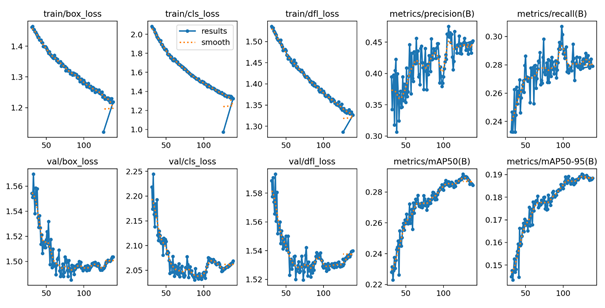

In [1]:
from IPython.display import Image
Image("/content/matrice de confusion.png")

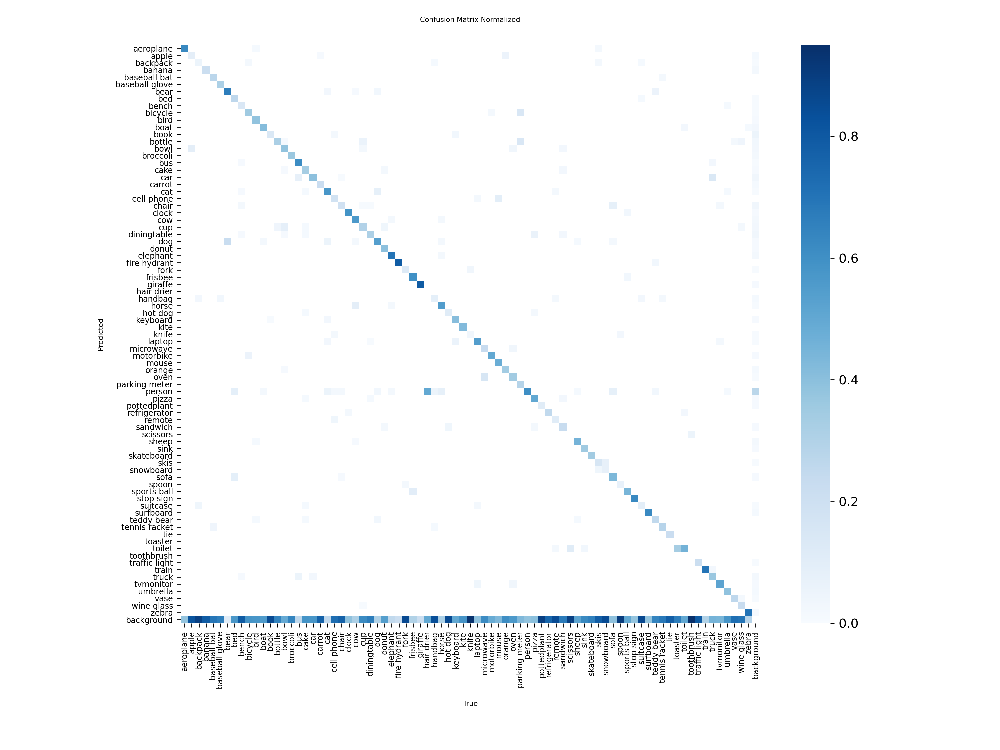

In [2]:
Image("/content/confusion_matrix_normalized.png")

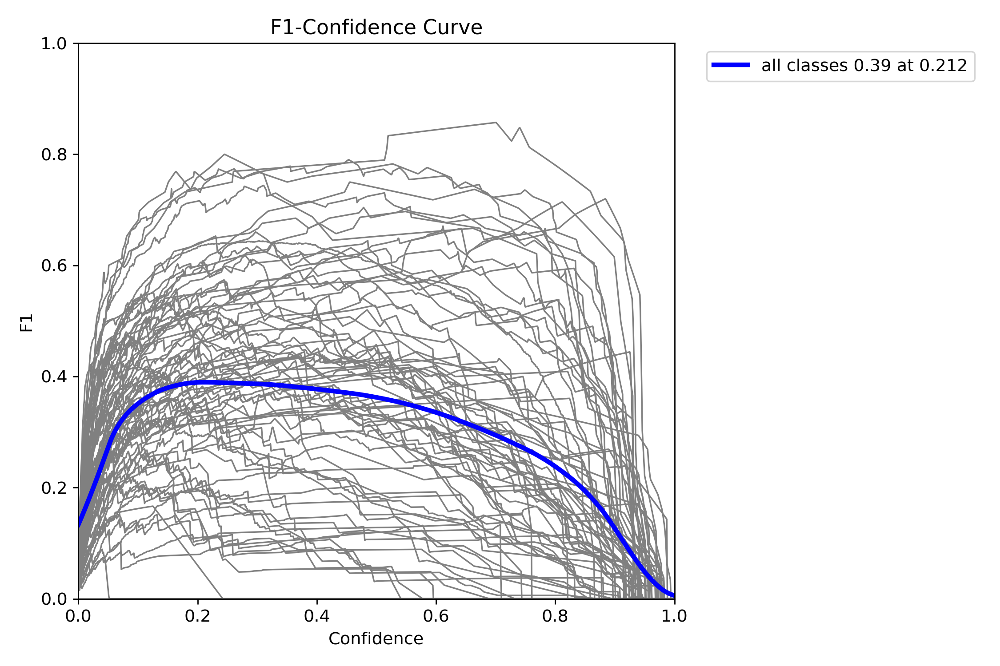

In [5]:
Image("/content/BoxF1_curve.png")

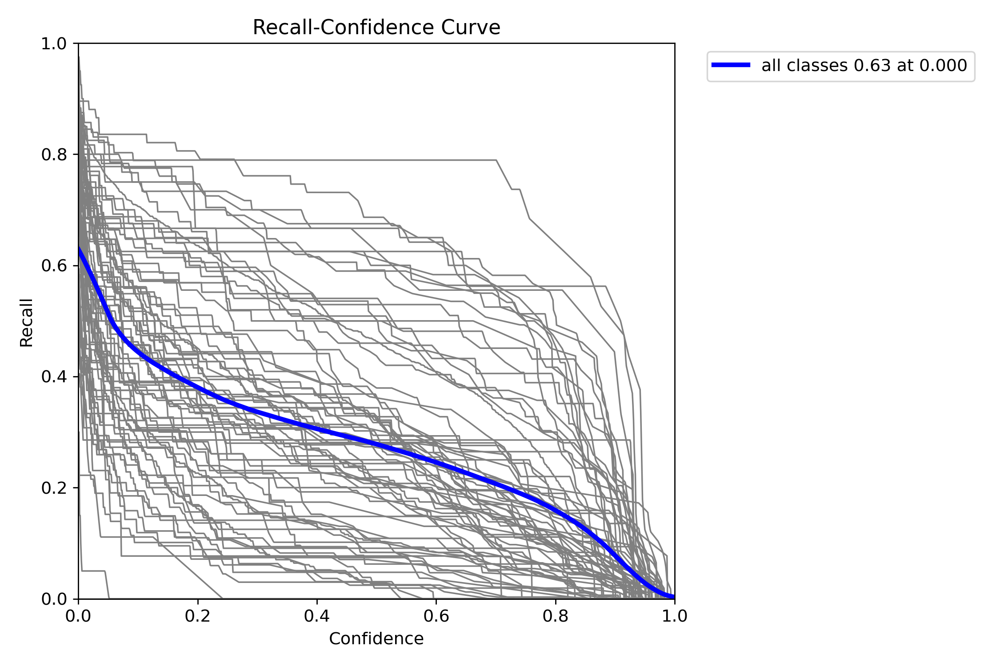

In [8]:
Image("/content/BoxR_curve.png")

#Evaluate the Model

In [ ]:
!pip install ultralytics
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
import os
print(os.listdir('/content/'))

['.config', 'yolo12s.pt', 'test.jpeg', 'IMG-20250129-WA0114.jpg', 'ms-coco-2017-6', 'runs', "Capture d'écran 2024-11-26 151552.png", 'Yolotest.mp4', 'best.pt', 'yolo11n.pt', 'coco-4', 'sample_data']


In [ ]:
model1 = YOLO("/content/best.pt")


image 1/1 /content/test.jpeg: 480x640 1 person, 1 bicycle, 1 dog, 55.2ms
Speed: 2.4ms preprocess, 55.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57:

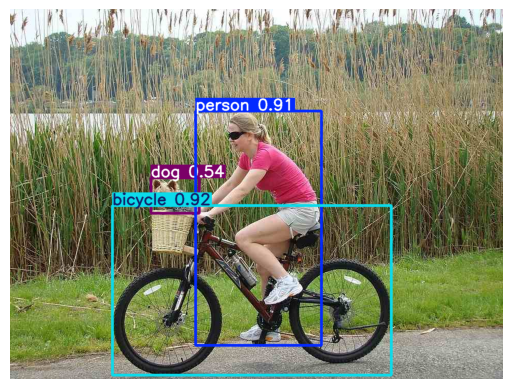

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Charger le modèle
model = YOLO("/content/yolo12s.pt")  # par ex: "runs/train/exp/weights/best.pt"

# Définir le chemin de l'image et la confiance
image_path = "/content/test.jpeg"
confidence_threshold = 0.1  # change entre 0 et 1

# Lancer la prédiction avec le threshold choisi
results = model.predict(
    source=image_path,
    conf=confidence_threshold,
    save=False,  # si True, enregistre les images dans runs/predict
    imgsz=640
)

# Afficher les résultats
for result in results:
    print(result.names)   # noms des classes
    print(result.boxes)   # coordonnées et scores

# Récupérer et afficher l'image annotée
annotated_img = results[0].plot()  # image avec les bounding boxes
annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)  # conversion BGR → RGB pour plt
plt.imshow(annotated_img)
plt.axis("off")
plt.show()

In [ ]:
#  Importations
from google.colab import files
from IPython.display import Video, display
import ipywidgets as widgets
from IPython.display import clear_output


# Charger le modèle YOLOv12

model_path = "/content/best.pt"  # <-- changer selon ton modèle
model = YOLO(model_path)

# Upload vidéo
print("Sélectionnez une vidéo à uploader")
uploaded = files.upload()
video_path = list(uploaded.keys())[0]

# Slider pour le threshold de confiance
confidence_slider = widgets.FloatSlider(
    value=0.4,
    min=0.1,
    max=1.0,
    step=0.05,
    description='Confidence:',
    continuous_update=False
)
display(confidence_slider)

# Bouton pour lancer l’inférence
button = widgets.Button(description=" Traiter la vidéo")

output = widgets.Output()
display(button, output)

def process_video(b):
    clear_output(wait=True)
    display(confidence_slider, button, output)
    conf = confidence_slider.value
    print(f"Traitement de la vidéo avec un seuil de confiance = {conf} ...")

    # Utiliser la fonction intégrée YOLO pour traiter la vidéo
    results = model.predict(
        source=video_path,
        conf=conf,
        imgsz=640,
        save=True  # sauvegarde automatique dans runs/detect/predict
    )

    # Récupérer le chemin de la vidéo générée
    output_video = results[0].path
    print(f" Vidéo traitée : {output_video}")

    # Afficher la vidéo
    display(Video(output_video, embed=True))

button.on_click(process_video)


FloatSlider(value=0.4, continuous_update=False, description='Confidence:', max=1.0, min=0.1, step=0.05)

Button(description=' Traiter la vidéo', style=ButtonStyle())

Output()

Traitement de la vidéo avec un seuil de confiance = 0.4 ...

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/872) /content/Yolotest.mp4: 640x384 2 cars, 1 motorbike, 2 persons, 40.9ms
video 1/1 (frame 2/872) /content/Yolotest.mp4: 640x384 2 cars, 1 motorbike, 2 persons, 10.7ms
video 1/1 (frame 3/872) /content/Yolotest.mp4: 640x384 2 cars, 1 motorbike, 2 persons, 7.8ms
video 1/1 (frame 4/872) /content/Yolotest.mp4: 640x384 2 cars, 1 motorbike, 2 persons, 7.6ms
video 1/1 (frame 5/872

In [ ]:
# Display the contents of the data.yaml file
with open('/content/ms-coco-2017-6/data.yaml', 'r') as f:
    print(f.read())

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 80
names: ['airplane', 'apple', 'backpack', 'banana', 'baseball bat', 'baseball glove', 'bear', 'bed', 'bench', 'bicycle', 'bird', 'boat', 'book', 'bottle', 'bowl', 'broccoli', 'bus', 'cake', 'car', 'carrot', 'cat', 'cell phone', 'chair', 'clock', 'couch', 'cow', 'cup', 'dining table', 'dog', 'donut', 'elephant', 'fire hydrant', 'fork', 'frisbee', 'giraffe', 'hair drier', 'handbag', 'horse', 'hot dog', 'keyboard', 'kite', 'knife', 'laptop', 'microwave', 'motorcycle', 'mouse', 'orange', 'oven', 'parking meter', 'person', 'pizza', 'potted plant', 'refrigerator', 'remote', 'sandwich', 'scissors', 'sheep', 'sink', 'skateboard', 'skis', 'snowboard', 'spoon', 'sports ball', 'stop sign', 'suitcase', 'surfboard', 'teddy bear', 'tennis racket', 'tie', 'toaster', 'toilet', 'toothbrush', 'traffic light', 'train', 'truck', 'tv', 'umbrella', 'vase', 'wine glass', 'zebra']

roboflow:
  workspace: alpha-oumar-diallo-6bn8y
  project

In [ ]:
# Voir le mapping ID → label

print("Label map :", label_map)


Label map : {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone',

Utilisation du device : cuda

image 1/1 /content/Capture d'écran 2024-11-26 151552.png: 384x640 9 persons, 1 chair, 6 potted plants, 1 dining table, 9 laptops, 1 vase, 70.9ms
Speed: 3.6ms preprocess, 70.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


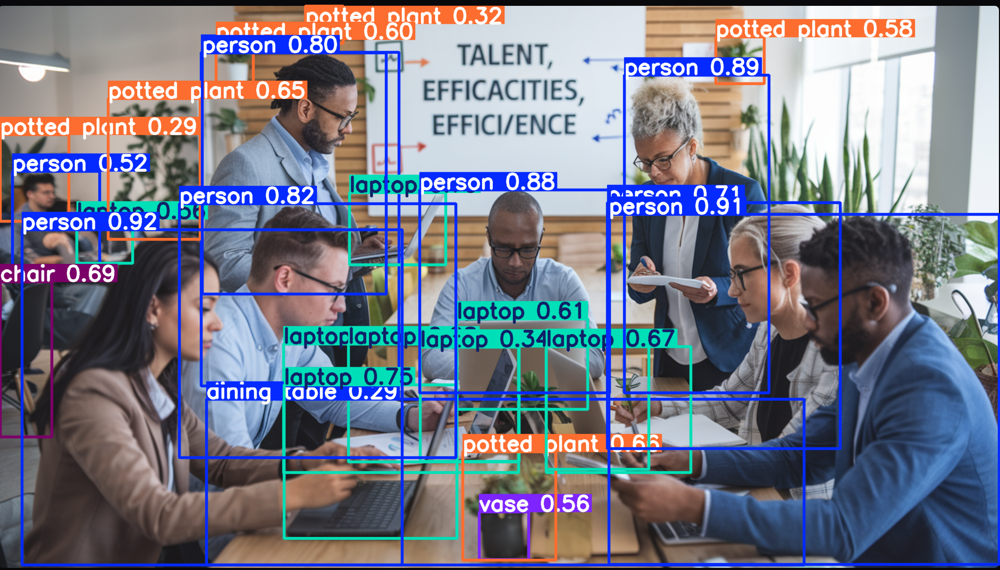

In [ ]:
from ultralytics import YOLO
import torch
import os

# Vérifier si CUDA (GPU) est disponible et s'il y a des périphériques CUDA détectés
device = 'cuda' if torch.cuda.is_available() and torch.cuda.device_count() > 0 else 'cpu'
print(f"Utilisation du device : {device}")

# Charger le modèle
model = YOLO('/content/best.pt')
# Utiliser le chemin de l'image qui a été téléchargée et utilisée précédemment
image_path = "/content/Capture d'écran 2024-11-26 151552.png"

# Vérifier si l'image existe (devrait exister si les cellules précédentes ont été exécutées)
if os.path.exists(image_path):
    results = model(image_path, device=device)
    results[0].show()  # Affiche l'image avec détections
else:
    print(f" Fichier non trouvé : {image_path}")
    print("Veuillez vous assurer que les cellules pour télécharger l'image ont été exécutées.")